In [1]:
import os
os.environ['CUDA_VISIBLE_DEVICES']='0'

from fastai import *
from fastai.vision import *
from superRes.generators import *
from superRes.critics import *
from superRes.dataset import *
from superRes.loss import *
from superRes.save import *
from superRes.fid_loss import *
from superRes.ssim import *
from PIL import Image, ImageDraw, ImageFont
from PIL import ImageFile
from pathlib import Path

import torchvision
from efficientnet_pytorch import EfficientNet
from torchvision.models import vgg16_bn

In [2]:
def get_data(bs:int, sz:int, keep_pct:float):
    return get_databunch(sz=sz, bs=bs, crappy_path=path_lowRes, 
                         good_path=path_fullRes, 
                         random_seed=None, keep_pct=keep_pct)

def get_DIV2k_data(pLow, bs:int, sz:int):
    """Given the path of low resolution images with a proper suffix
       returns a databunch
    """
    suffixes = {"dataset/DIV2K_train_LR_x8": "x8",
                "dataset/DIV2K_train_LR_difficult":"x4d", 
                "dataset/DIV2K_train_LR_mild":"x4m"}
    lowResSuffix = suffixes[str(pLow)]
    src = ImageImageList.from_folder(pLow).split_by_idxs(train_idx=list(range(0,800)), valid_idx=list(range(800,900)))
    
    data = (src.label_from_func(lambda x: path_fullRes/(x.name).replace(lowResSuffix, '')).transform(
            get_transforms(
                flip_vert=True,
                max_rotate=30,
                max_zoom=3.,
                max_lighting=.4,
                max_warp=.4,
                p_affine=.85
            ),
            size=sz,
            tfm_y=True,
        ).databunch(bs=bs, num_workers=8, no_check=True).normalize(imagenet_stats, do_y=True))
    data.c = 3
    return data

def create_training_images(fn, i, p_hr, p_lr, size):
    """Create low quality images from folder p_hr in p_lr"""
    dest = p_lr/fn.relative_to(p_hr)
    dest.parent.mkdir(parents=True, exist_ok=True)
    img = PIL.Image.open(fn)
    targ_sz = resize_to(img, size, use_min=True)
    img = img.resize(targ_sz, resample=PIL.Image.BILINEAR).convert('RGB')
    img.save(dest, quality=60)

In [3]:
def do_fit(learn, epochs,save_name, lrs=slice(1e-3), pct_start=0.9):
    learn.fit_one_cycle(epochs, lrs, pct_start=pct_start)
    learn.save(save_name)
    learn.show_results(rows=1, imgsize=7)

In [4]:
path = Path('./dataset/')

path_fullRes = path/'DIV2K_train_HR'
path_lowRes_diff = path/'DIV2K_train_LR_difficult' # suffix "x4d" ~300px
path_lowRes_mild = path/'DIV2K_train_LR_mild' # suffix "x4m" ~300px
path_lowRes_x8 = path/'DIV2K_train_LR_x8' # suffix "x8" ~150px


proj_id = 'unet_superRes_mobileNet_FeatSSIM'

gen_name = proj_id + '_gen'
crit_name = proj_id + '_crit'

nf_factor = 2
pct_start = 1e-8

In [5]:
print(path_fullRes)

dataset/DIV2K_train_HR


torch.Size([3, 169, 255])


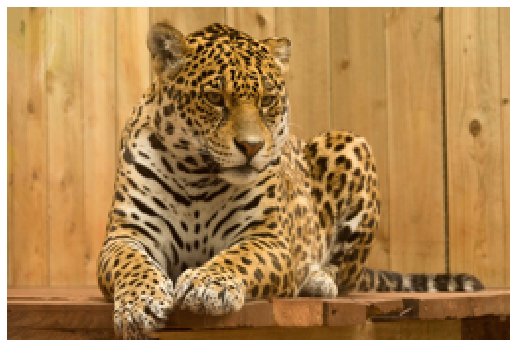

In [6]:
il = ImageList.from_folder(path_lowRes_x8)
print(il[10].shape)
il[10].show(figsize=(9,9))

In [5]:
model = geffnet.mobilenetv3_100
# model = models.resnet34
# model= geffnet.tf_efficientnet_b4

In [6]:
# loss_func = FeatureLoss()
loss_func = msssim
# loss_func = calculate_frechet_distance

# 128px

In [9]:
bs=20
sz=128
lr = 1e-2
wd = 1e-3
epochs = 5

In [12]:
data_gen = get_DIV2k_data(path_lowRes_x8, bs=bs, sz=sz)

In [11]:
t = data_gen.valid_ds[0][1].data
t = torch.stack([t,t])


def gram_matrix(x):
    n,c,h,w = x.size()
    x = x.view(n, c, -1)
    return (x @ x.transpose(1,2))/(c*h*w)


gram_matrix(t)

base_loss = F.l1_loss

vgg_m = vgg16_bn(True).features.cuda().eval()
requires_grad(vgg_m, False)

blocks = [i-1 for i,o in enumerate(children(vgg_m)) if isinstance(o,nn.MaxPool2d)]
blocks, [vgg_m[i] for i in blocks]

class FeatureLoss(nn.Module):
    def __init__(self, m_feat, layer_ids, layer_wgts):
        super().__init__()
        self.m_feat = m_feat
        self.loss_features = [self.m_feat[i] for i in layer_ids]
        self.hooks = hook_outputs(self.loss_features, detach=False)
        self.wgts = layer_wgts
        self.metric_names = ['pixel',] + [f'feat_{i}' for i in range(len(layer_ids))
              ] + [f'gram_{i}' for i in range(len(layer_ids))]

    def make_features(self, x, clone=False):
        self.m_feat(x)
        return [(o.clone() if clone else o) for o in self.hooks.stored]
    
    def forward(self, input, target):
        out_feat = self.make_features(target, clone=True)
        in_feat = self.make_features(input)
        self.feat_losses = [base_loss(input,target)]
        self.feat_losses += [base_loss(f_in, f_out)*w
                             for f_in, f_out, w in zip(in_feat, out_feat, self.wgts)]
        self.feat_losses += [base_loss(gram_matrix(f_in), gram_matrix(f_out))*w**2 * 5e3
                             for f_in, f_out, w in zip(in_feat, out_feat, self.wgts)]
        self.metrics = dict(zip(self.metric_names, self.feat_losses))
        return sum(self.feat_losses)
    
    def __del__(self): self.hooks.remove()

feat_loss = FeatureLoss(vgg_m, blocks[2:5], [5,15,2])

In [12]:
learn_gen = gen_learner_wide(data=data_gen,
                             gen_loss=feat_loss,
                             arch = model,
                             nf_factor=nf_factor)
learn_gen.freeze()

In [13]:
wandbCallbacks = False

if wandbCallbacks:
    import wandb
    from wandb.fastai import WandbCallback
    config={"batch_size": bs,
            "img_size": (sz, sz),
            "learning_rate": lr,
            "weight_decay": wd,
            "num_epochs": epochs
    }
    wandb.init(project='SuperRes', config=config, id="gen_mobilenetV3_SSIM"+ datetime.now().strftime('_%m-%d_%H:%M'))

    learn_gen.callback_fns.append(partial(WandbCallback, input_type='images'))

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


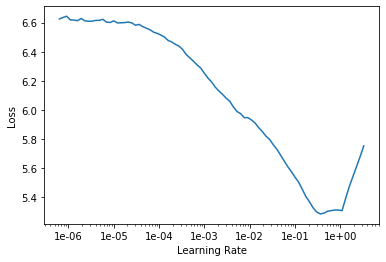

In [14]:
learn_gen.lr_find()
learn_gen.recorder.plot()
# learn_gen.summary()

epoch,train_loss,valid_loss,time
0,4.646515,3.137923,00:40
1,3.013014,1.620023,00:39
2,2.159028,1.338955,00:35
3,1.707297,1.170396,00:34


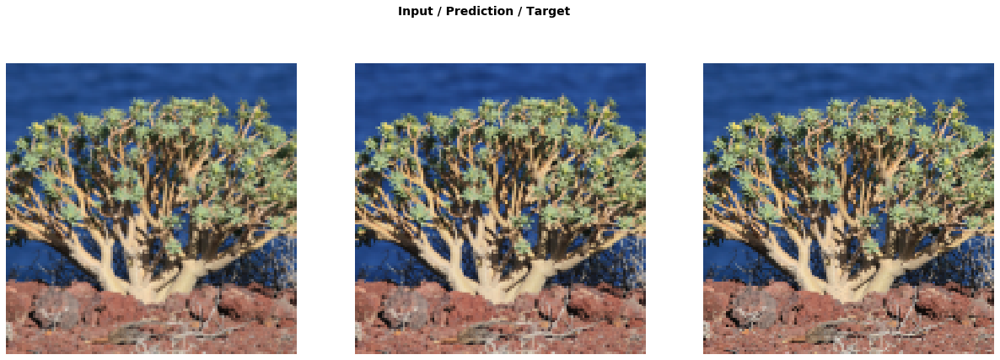

In [15]:
do_fit(learn_gen, 4, gen_name+"_128px_0", slice(lr*10))

# 256px

In [16]:
bs=5
sz=256
lr = 1e-2
wd = 1e-3
epochs = 3

In [17]:
data_gen = get_DIV2k_data(path_lowRes_diff, bs=bs, sz=sz)

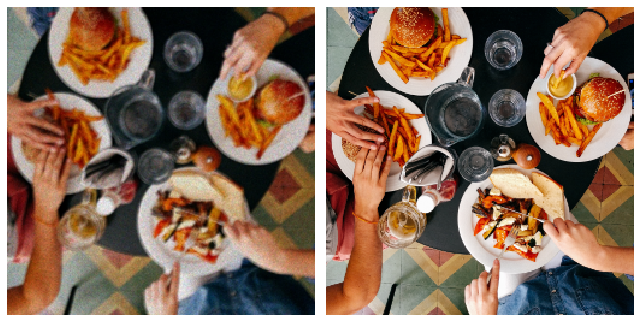

In [18]:
data_gen.show_batch(ds_type=DatasetType.Valid, rows=1, figsize=(9,9))

In [19]:
learn_gen.data = data_gen

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


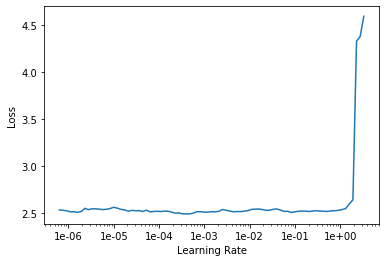

In [20]:
learn_gen.lr_find()
learn_gen.recorder.plot()
# learn_gen.summary()

epoch,train_loss,valid_loss,time
0,2.549691,2.592117,01:54
1,2.505261,2.602561,01:54
2,2.520705,2.598113,01:54


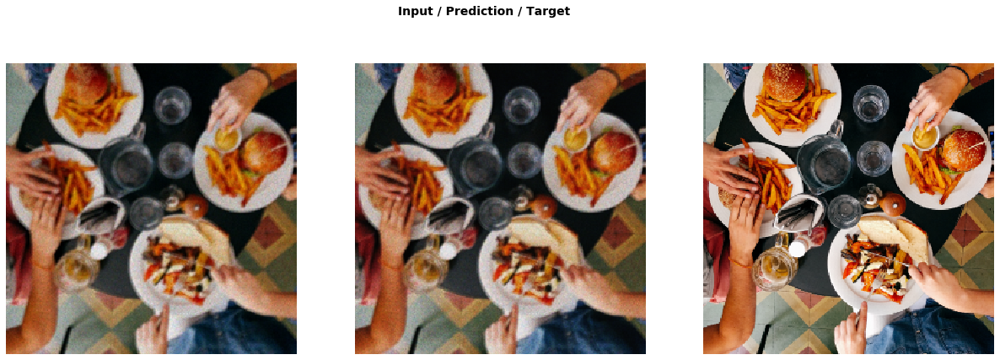

In [21]:
do_fit(learn_gen, 3, gen_name+"_256px_0", slice(1e-6))

In [22]:
# learn_gen.unfreeze()

In [23]:
# do_fit(learn_gen, 3, gen_name+"_256px_1", slice(lr))

# 512px

In [8]:
bs=1
sz=512
epochs = 5

In [18]:
data_gen = get_DIV2k_data(path_lowRes_mild, bs, sz)

In [19]:
learn_gen.data = data_gen
learn_gen.freeze()
gc.collect()

42

In [27]:
# learn_gen.load(gen_name+"_256px_0")

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


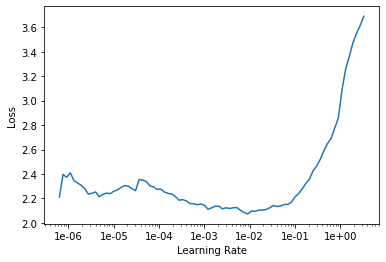

In [28]:
learn_gen.lr_find()
learn_gen.recorder.plot()

Upsize to gen_512


epoch,train_loss,valid_loss,time
0,2.051661,2.265791,07:40
1,2.147021,2.221345,07:39
2,2.082175,2.150938,07:39


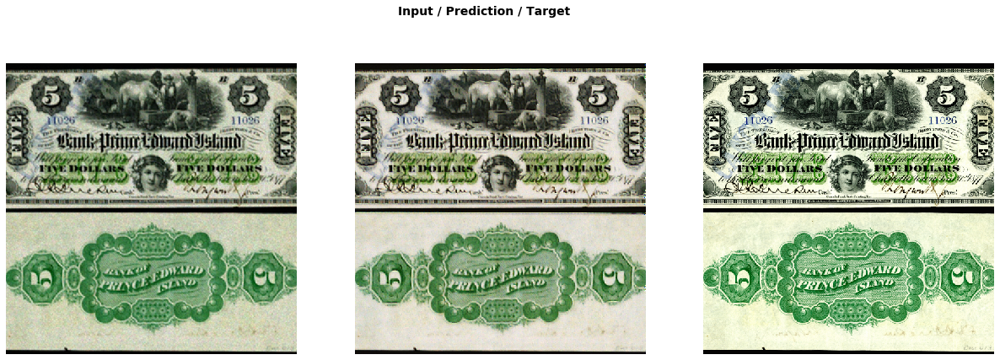

In [29]:
print("Upsize to gen_512")

do_fit(learn_gen, 3, gen_name+"_512px_0",slice(1e-2))

In [30]:
learn_gen.unfreeze()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


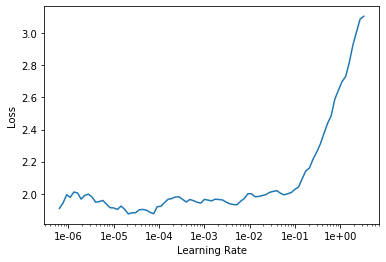

In [31]:
learn_gen.lr_find()
learn_gen.recorder.plot()

epoch,train_loss,valid_loss,time
0,1.984773,2.225525,07:51


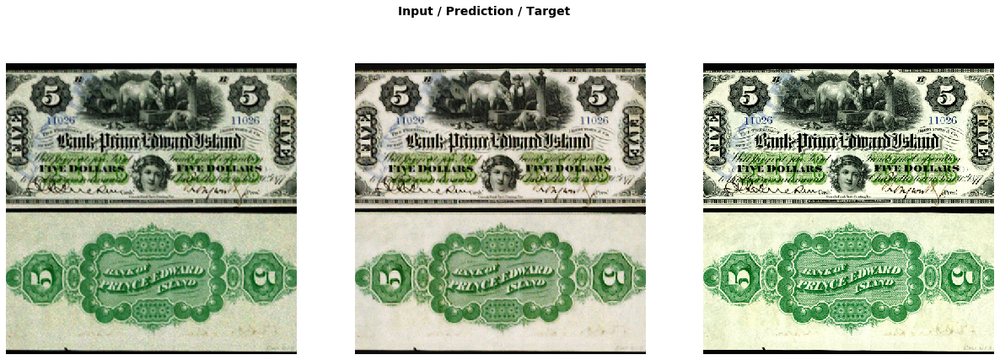

In [32]:
do_fit(learn_gen, 1, gen_name+"_512px_1", slice(1e-5))

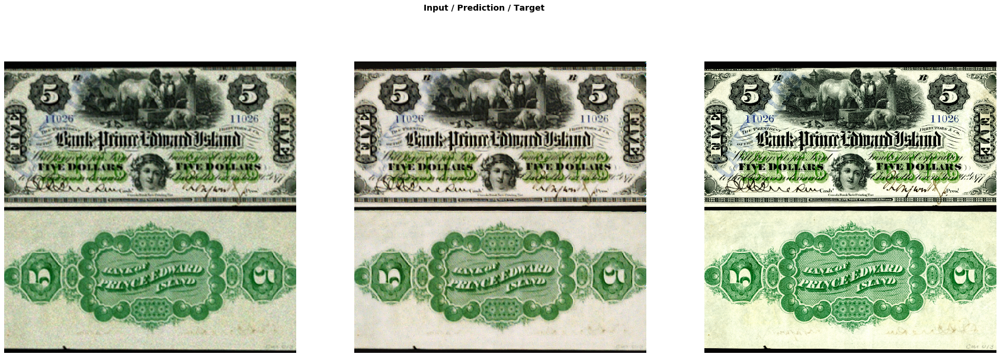

In [33]:
learn_gen.show_results(rows=1, imgsize=10)

In [14]:
learn_gen = gen_learner_wide(data=data_gen,
                             gen_loss= msssim,
                             arch = model,
                             nf_factor=nf_factor)
gc.collect()

8

In [17]:
learn_gen.load("unet_superRes_efficientNetB4_SSIM_gen_512px_1")

Learner(data=ImageDataBunch;

Train: LabelList (800 items)
x: ImageImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
y: ImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
Path: dataset/DIV2K_train_LR_x8;

Valid: LabelList (100 items)
x: ImageImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
y: ImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
Path: dataset/DIV2K_train_LR_x8;

Test: None, model=DynamicUnetWide(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(16, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (2): HardSwish()
      (3): Sequential(
        (0): Sequential(
          (0): DepthwiseSeparableConv(
            (

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


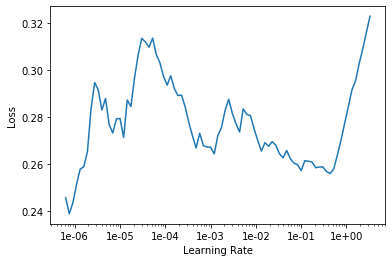

In [20]:
learn_gen.lr_find()
learn_gen.recorder.plot()

epoch,train_loss,valid_loss,time
0,0.249796,0.205186,06:54


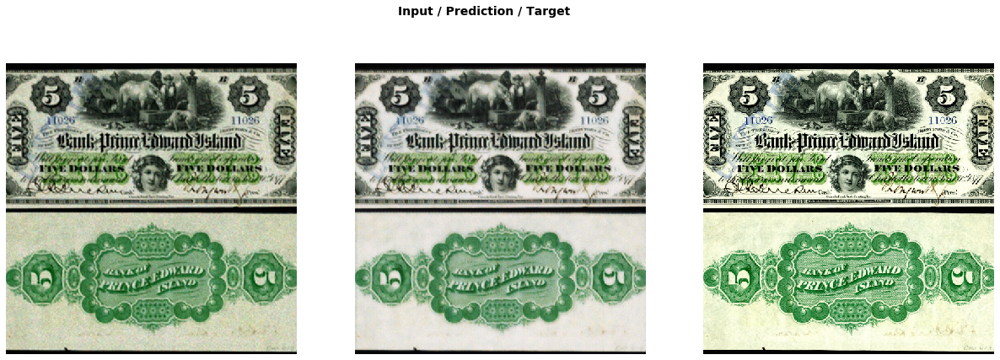

In [36]:
do_fit(learn_gen, 1, gen_name+"_512px_2",slice(1e-2))

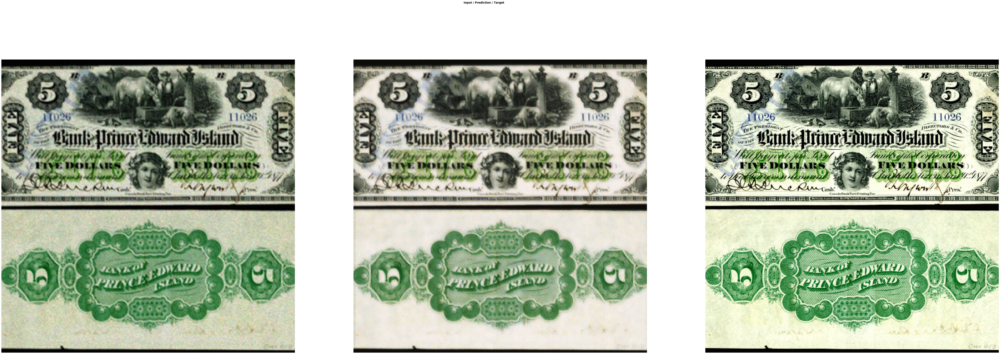

In [24]:
learn_gen.show_results(rows=1, imgsize=30)

torch.Size([3, 169, 255])


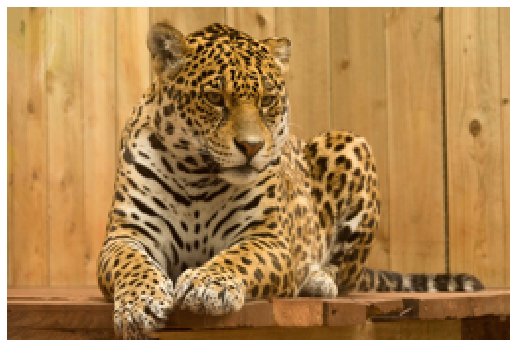

In [25]:
il = ImageList.from_folder(path_lowRes_x8)
print(il[10].shape)
il[10].show(figsize=(9,9))

Image (3, 512, 512)


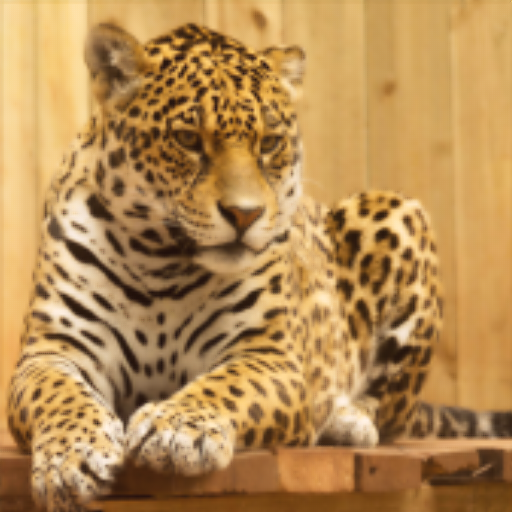

In [35]:
img = learn_gen.predict(il[10])
print(img[0])
img[0]